Martina Carretta (1673930), Meritxell Carvajal (1671647)

# Fundamentals of Computer Vision: Applied Projects


This Jupyter notebook contains the bases of the projects you need to develop during the semester.

The main goal of this project is twofold: 1st is to reiterate the theoretical context of the lectures and 2nd to use those methods in adapted examples for real-world scenarios.

---

## Import libraries, util functions and test image loading



In [4]:
import cv2
import urllib3
import numpy as np
from typing import List, Tuple  # for type hinting

from PIL import Image

from matplotlib import pyplot as plt


# Block 3. Segmentation as region classifiers

## List of segmentation algorithms by type

### Threshold-Based Segmentation (Mandatory. Implement by hand / Extend from previous labs)
- **Global Thresholding**: Applies a single threshold value across the entire image to separate objects from the background.
- **Adaptive Mean Thresholding**: Computes thresholds for different regions of the image based on mean values to handle varying lighting conditions.
- **Otsu's Thresholding**: Calculates an optimal threshold value that minimizes intra-class variance, or equivalently, maximizes inter-class variance.

### Edge-Based Segmentation (Mandatory. Implement by hand / Extend from previous labs)
- **Sobel Operator**: Detects edges using a pair of 3x3 convolution kernels, one for horizontal changes, and one for vertical.
- **Canny Edge Detector**: A multi-stage algorithm that includes noise reduction, gradient calculation, non-maximum suppression, and edge tracking by hysteresis.
- **Laplacian of Gaussian (LoG)**: Applies a Gaussian blur to smooth the image before computing the Laplacian for edge detection, capturing blobs and edges.

### Watershed-Based Segmentation (Mandatory. Use OpenCV implementation)
- **Watershed Algorithm**: Treats the gradient magnitude of an image as a topographic surface and finds watershed lines to segment the image based on catchment basins.

### Region-Based Segmentation (Choose 1. Implement by hand. Can make use of scikit-image library)
- **Split-and-Merge**: This technique recursively splits an image into regions based on a homogeneity criterion and then merges adjacent regions that have similar properties.
- **Flood Fill**: Also known as seed fill, this method starts from a seed point and grows a region by adding neighboring pixels that are similar to the seed.
Represents an image as a graph, where nodes correspond to segments and edges represent adjacency between segments, then merges nodes based on similarity measures.

### Clustering-Based Segmentation (Only analysis)
- **K-means Clustering**: Partitions the image into clusters based on pixel color or intensity, with the number of clusters predefined.
- **Gaussian Mixture Models (GMM)**: Uses a probabilistic model to represent normally distributed subpopulations within the overall population, providing a soft-segmentation of the image.


### List of ideas for improving some methods results
---

### Threshold-Based Segmentation

Global Thresholding:
1. Implement histogram analysis to automatically select a better global threshold.
2. Experiment with different global thresholds and evaluate the results using entropy-based or region-based metrics.

Adaptive Mean Thresholding:
1. Explore the use of different shapes and sizes for the local neighborhood when computing the mean value.
2. Combine with a preprocessing step that performs histogram equalization to enhance contrast before thresholding.

Otsu's Thresholding:
1. Extend Otsu's method to work with multi-level thresholds instead of just bi-level thresholds.


### Edge-Based Segmentation

Canny Edge Detector:
1. Optimize the selection of low and high threshold values using the median of the gradient magnitudes.
2. Implement an automated hysteresis process that adapts to the edge strength histogram of the image.

Laplacian of Gaussian (LoG):
1. Experiment with scale-space representation by varying the standard deviation of the Gaussian filter.
2. Automate the selection of the Gaussian kernel size based on the analysis of the image frequencies.

### Watershed-Based Segmentation

Watershed Algorithm:
1. Implement pre-processing steps to reduce noise, such as morphological operations, before applying the watershed.
2. Use marker-based watershed segmentation, where markers are determined automatically through morphological operations or distance transformation.

### Region-Based Segmentation

Split-and-Merge (RAG):
1. Incorporate texture or color gradients as additional criteria for deciding splits or merges, enhancing the segmentation for complex scenes.

Flood Fill:
1. Develop an adaptive flood fill algorithm where the tolerance level for pixel similarity is determined based on local image statistics.
2. Integrate edge detection results to guide the flood fill process, preventing it from crossing likely boundaries.


## Mandatory Questions

#### Threshold-Based Segmentation
1. Explain the basic concept of global thresholding. How is a single threshold value determined and applied across the entire image?
2. In what scenarios is adaptive mean thresholding more effective than global thresholding?
3. Describe Otsu's thresholding method in detail. How does it compute an optimal threshold value, and what makes it different from simple global thresholding?

#### Edge-Based Segmentation
4. Describe how the Sobel operator works. What are the roles of its horizontal and vertical kernels?
5. Explain the steps involved in the Canny Edge Detector algorithm.
6. What is the Laplacian of Gaussian? How does it differ from applying a Laplacian filter directly?

#### Watershed-Based Segmentation
7. Describe the watershed algorithm. How does it use the concept of topography to segment images?

#### Region-Based Segmentation*
8. Explain the process of region growing. How does the algorithm determine which pixels to include in a region?
9. Describe mean-shift segmentation. What are its main advantages and limitations?
10. What is the split-and-merge approach to image segmentation? How does it differ from region growing?
11. Explain the flood fill algorithm. In what situations is it most effective?

#### Clustering-Based Segmentation
12. How does K-means clustering segment an image? What are the limitations of this method?
13. Explain both Gaussian Mixture Models and K-means in the context of image segmentation. Which are the similarities and difference between the methods?


*Answer only the ones related to your selection

### Optional Questions

1. Compare and contrast the output of edge-based and region-based segmentation techniques. In what situations would you prefer one over the other? Explain why and provide examples on each method perform better than the other.
2. How does the choice of parameters (like kernel size or threshold values) affect the outcome of different segmentation algorithms? Since it can affect differently depending on the algorithm, explain how affects on each of them.
3. Analyze the computational complexity of the different segmentation methods. Which methods are more suitable for real-time applications? Provide "big O" notation and an estimation of the execution time for the methods.
4. Discuss the challenges of segmenting images with low contrast. What methods can be particularly effective in these scenarios?
5. Investigate the impact of image resolution on the performance of various segmentation algorithms. Are they sensitive or not?
6. Explore the use of segmentation in object tracking (segment and recognize the same object in a video). Which methods are most effective and why?
7. Discuss the limitations of traditional segmentation techniques in handling complex images and suggest potential improvements.
8. Evaluate the effectiveness of combining multiple segmentation techniques. Can hybrid approaches yield better results? Propose some hybrid methods. Are ensemble methods enough for improving results?
9. Analyze the role of color spaces in image segmentation. How does the choice of color space affect segmentation performance?


Since `Optional questions` ask about several topics I suggest to tackle them into a separete section in the report (Discussion / Comparision / Analysis) instead of including fragrments of the answer across each type of the method

## 1. Threshold-based Segmentation Exercise
**Objective:**  
Implement basic global thresholding method.
Then the adaptive version. Later implement Otsu's thresholding algorithm to find automatically the best value. Finally implement the local versions of those algorithms.

**Guideline:**
1. Load a grayscale image.
2. Apply basic global thresholding on the image.
3. Apply local basic thresholding on the image (adaptive mean thresholding)
3. Implement Otsu's threshold selection algorithm.
4. Apply and compare the results to the basic counterparts

**Expected Results:**  
- Segmented image with the different thresholding methods


In [45]:
import numpy as np
import matplotlib.pyplot as plt

def global_thresholding(image, threshold):
    output = np.zeros_like(image, dtype = np.uint8)
    for i in range (image.shape[0]):
        for j in range (image.shape[1]):
            if image[i][j] >= threshold:
                output[i][j] = 1
            else:
                output[i][j] = 0
    return output

def adaptive_mean_thresholding(image, region_size, C):
    equalized = cv2.equalizeHist(image)
    output = np.zeros_like(equalized, dtype = np.uint8)
    
    for i in range (equalized.shape[0]):
        for j in range (equalized.shape[1]):
            x = region_size // 2
            
            # Ensure it doesn't go out of range
            i_start = max(0, i - x)
            i_end = min(equalized.shape[0], i + x + 1)
            j_start = max(0, j - x)
            j_end = min(equalized.shape[1], j + x + 1)

            window = equalized[i_start:i_end, j_start:j_end]
            
            mean = np.mean(window)
            threshold = mean - C
            if equalized[i][j] >= threshold:
                output[i][j] = 1
            else:
                output[i][j] = 0
    return output

import numpy as np

def otsu_thresholding(image):
    # Compute histogram of the image
    histogram, bin_edges = np.histogram(image.ravel(), bins = 256, range = (0, 256))

    # Total number of pixels
    total = image.shape[0] * image.shape[1]

    current_max, threshold = 0, 0
    sum_total, sum_foreground, sum_background = np.sum(histogram * np.arange(256)), 0, 0 # * np.arrange to multiply the frequencies by the values to get the sum of intensities
    weight_background, weight_foreground = 0, 0

    for i, frequency in enumerate(histogram):
        weight_background += frequency # Cumulative frequency to the left
        weight_foreground = total - weight_background # Cumulative frequency to the right

        if weight_background == 0 or weight_foreground == 0:
            continue

        sum_background += i * frequency # Cumulative intensities
        mean_background = sum_background / weight_background # Mean to the left
        mean_foreground = (sum_total - sum_background) / weight_foreground # Mean to the right

        var_interclass = weight_background * weight_foreground * ((mean_background - mean_foreground) ** 2) # Formula

        # Check if new maximum found
        if var_interclass > current_max:
            current_max = var_interclass
            threshold = i

    return threshold

def local_thresholding(image, method, kernel_size = 0, C = 0):
    if method == "global":
        hist, bins = np.histogram(img.flatten(), bins = 256, range = (0, 256), density = True)
        threshold = int(np.argmax(hist[:256]))
        output = global_thresholding(image, threshold)
    if method == "adaptative":
        output = adaptive_mean_thresholding(image, kernel_size, C)
    if method == "otsu":
        t = otsu_thresholding(image)
        #print(t)
        output = global_thresholding(image, t)
    return output

In [42]:
img = cv2.imread("./images/images/aeroplane/2011_002114.jpg", 0)

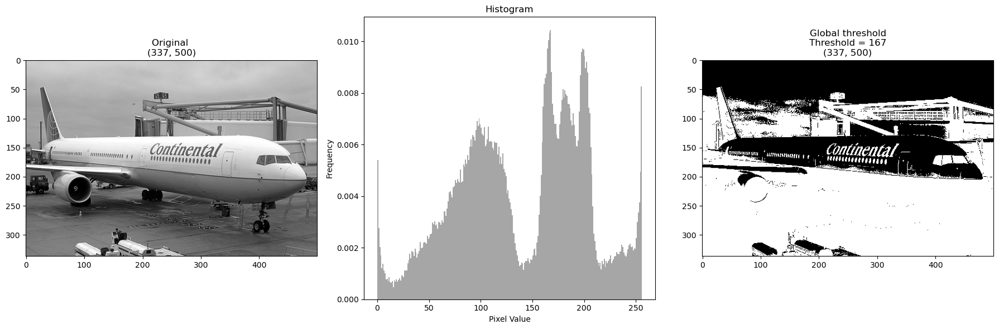

In [43]:
# Choosing threshold
hist, bins = np.histogram(img.flatten(), bins = 256, range = (0, 256), density = True)
threshold = int(np.argmax(hist[:256]))

global_thres = local_thresholding(img, "global")

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(img, cmap="gray")
axes[0].set_title("Original \n" + str(img.shape))

axes[1].hist(img.flatten(), bins = 256, range = (0, 256), density = True, color = 'gray', alpha = 0.7)
axes[1].set_title('Histogram')
axes[1].set_xlabel('Pixel Value')
axes[1].set_ylabel('Frequency')

axes[2].imshow(global_thres, cmap="binary")
axes[2].set_title("Global threshold\nThreshold = " + str(threshold) + "\n" + str(global_thres.shape))

plt.tight_layout()
plt.show()

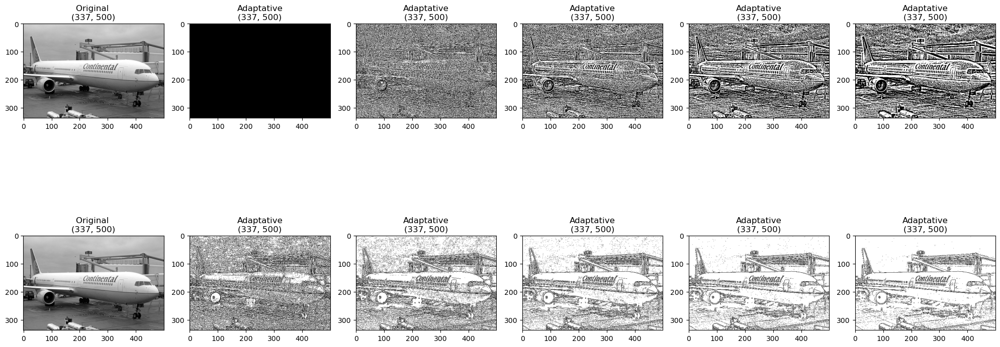

In [29]:
adaptative1 = local_thresholding(img, "adaptative", kernel_size = 1, C = 0)
adaptative2 = local_thresholding(img, "adaptative", kernel_size = 3, C = 0)
adaptative3 = local_thresholding(img, "adaptative", kernel_size = 5, C = 0)
adaptative4 = local_thresholding(img, "adaptative", kernel_size = 7, C = 0)
adaptative5 = local_thresholding(img, "adaptative", kernel_size = 9, C = 0)

adaptative6 = local_thresholding(img, "adaptative", kernel_size = 3, C = 1)
adaptative7 = local_thresholding(img, "adaptative", kernel_size = 3, C = 3)
adaptative8 = local_thresholding(img, "adaptative", kernel_size = 3, C = 5)
adaptative9 = local_thresholding(img, "adaptative", kernel_size = 3, C = 7)
adaptative10 = local_thresholding(img, "adaptative", kernel_size = 3, C = 9)

'''
Explore the use of different shapes and sizes for the local neighborhood when computing the mean value.
Combine with a preprocessing step that performs histogram equalization to enhance contrast before thresholding.
'''

# Plot
fig, axes = plt.subplots(2, 6, figsize = (20, 10))
axes[0][0].imshow(img, cmap="gray")
axes[0][0].set_title("Original \n" + str(img.shape))
axes[0][1].imshow(adaptative1, cmap="gray")
axes[0][1].set_title("Adaptative\n" + str(adaptative1.shape))
axes[0][2].imshow(adaptative2, cmap="gray")
axes[0][2].set_title("Adaptative\n" + str(adaptative1.shape))
axes[0][3].imshow(adaptative3, cmap="gray")
axes[0][3].set_title("Adaptative\n" + str(adaptative1.shape))
axes[0][4].imshow(adaptative4, cmap="gray")
axes[0][4].set_title("Adaptative\n" + str(adaptative1.shape))
axes[0][5].imshow(adaptative5, cmap="gray")
axes[0][5].set_title("Adaptative\n" + str(adaptative1.shape))

axes[1][0].imshow(img, cmap="gray")
axes[1][0].set_title("Original \n" + str(img.shape))
axes[1][1].imshow(adaptative6, cmap="gray")
axes[1][1].set_title("Adaptative\n" + str(adaptative1.shape))
axes[1][2].imshow(adaptative7, cmap="gray")
axes[1][2].set_title("Adaptative\n" + str(adaptative1.shape))
axes[1][3].imshow(adaptative8, cmap="gray")
axes[1][3].set_title("Adaptative\n" + str(adaptative1.shape))
axes[1][4].imshow(adaptative9, cmap="gray")
axes[1][4].set_title("Adaptative\n" + str(adaptative1.shape))
axes[1][5].imshow(adaptative10, cmap="gray")
axes[1][5].set_title("Adaptative\n" + str(adaptative1.shape))

plt.tight_layout()
plt.show()

# After computing different trials, we see that the greater the C and kernel size, the more detail and less noise we get
# However, we get to a C point where we lose the lines

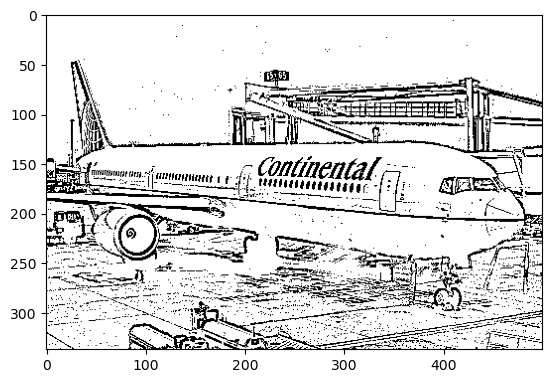

In [5]:
adaptative = local_thresholding(img, "adaptative", kernel_size = 7, C = 10)
plt.imshow(adaptative, cmap="gray")

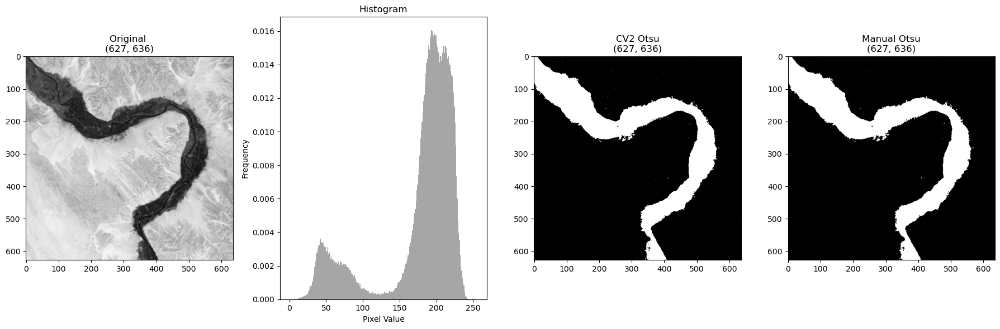

In [46]:
image = cv2.imread("./bimodal.png", 0)

otsu = local_thresholding(image, "otsu")

ret, a = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Plot
fig, axes = plt.subplots(1, 4, figsize=(18, 6))

axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original \n" + str(image.shape))

axes[1].hist(image.flatten(), bins = 256, range = (0, 256), density = True, color = 'gray', alpha = 0.7)
axes[1].set_title('Histogram')
axes[1].set_xlabel('Pixel Value')
axes[1].set_ylabel('Frequency')

axes[2].imshow(a, cmap="binary")
axes[2].set_title("CV2 Otsu\n"  + str(a.shape))
axes[3].imshow(otsu, cmap="binary")
axes[3].set_title("Manual Otsu\n"  + str(otsu.shape))

plt.tight_layout()
plt.show()

## 2. Edge-based Segmentation Exercise
**Objective:**  
Implement edge detectors based in sobel filters, Canny, and Laplacian of Gaussian.


**Guideline:**
1. Load a grayscale image.
2. Compute Sobel filters and the norm to obtain the edges of the image.
3. Implement Canny filter and compare the results to the Sobel results.
4. Implement Laplacian of Gaussian edge detectors.
5. (Optional) Find a method to fill the connected regions to obtain segmented regions (instead of edge regions)

**Expected Results:**  
- Segmented image with the different methods and comparison between them (qualitaively)


In [117]:
# From lab 1:
def convolution(image, kernel, stride=1, padding=0):
    #change of kernel with list comprehension
    kernel_2 = [row[::-1] for row in kernel]
    
    # Get dimensions of the image and kernel
    image_h, image_w = image.shape
    kernel_h, kernel_w = kernel.shape
    
    # Calculate dimensions of the output
    if kernel_h % 2 == 0: # We need different output sizes depending on if the kernel is even-number sized or not
        output_h = (image_h - kernel_h  + 2 * padding) // stride
        output_w = (image_w - kernel_w  + 2 * padding) // stride
    else:
        output_h = (image_h - kernel_h  + 2 * padding) // stride + 1
        output_w = (image_w - kernel_w  + 2 * padding) // stride + 1
    
    # temp is the original image with the necessary padding
    temp = np.full((image_h + 2*padding, image_w + 2*padding), 0)
    temp [padding:image_h + padding, padding:image_w + padding] = image #Padding of 1 and start at 1 finish at 10+1 = 11
    temp_h, temp_w = temp.shape
    
    # Create output with zeros
    output = np.full((output_h, output_w), 0)

    # Apply the convolution operation
    if kernel_h % 2 == 0: # Again take into consideration if we are using an eve-number kernel
        for i in range(0, temp_h - kernel_h, stride): #We need to do steps of stride size to omit some pixels
            for j in range(0, temp_w - kernel_w, stride):
                output [i//stride] [j//stride] = np.sum(temp [i: i + kernel_h, j : j + kernel_w] * kernel) # //stride because if i = 2, we need to go to pixel 1, when i = 4, we need to go to pixel 2
    else:
        for i in range(0, temp_h - kernel_h+1, stride): #We need to do steps of stride size to omit some pixels
            for j in range(0, temp_w - kernel_w+1, stride):
                output [i//stride] [j//stride] = np.sum(temp [i: i + kernel_h, j : j + kernel_w] * kernel) # //stride because if i = 2, we need to go to pixel 1, when i = 4, we need to go to pixel 2
    return output

In [118]:
def sobel_edge_detection(image):
    # Kernel
    sobel_x = np.array([[-1, 0, 1], 
                        [-2, 0, 2], 
                        [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], 
                        [0, 0, 0], 
                        [1, 2, 1]])

    # Convolution
    grad_x = np.abs(convolution(image, sobel_x))
    grad_y = np.abs(convolution(image, sobel_y))

    # Formula of gradient magnitude
    grad_magnitude = np.sqrt(grad_x**2 + grad_y**2)

    return grad_magnitude 

def non_maximum_suppression(gradient_magnitude, gradient_direction):
    # Thin out edges in the image.
    # magnitude and direction of the gradient at each pixel
    output = np.zeros_like(gradient_magnitude)
    
    # Traverse
    for i in range(1, gradient_magnitude.shape[0] - 1): # Exclude border pixels
        for j in range(1, gradient_magnitude.shape[1] - 1): # Exclude border pixels
            # Find pixels in the positive and negative gradient directions
            orientation = gradient_direction[i, j]
            q = gradient_magnitude[i, j + 1]
            r = gradient_magnitude[i, j - 1]
            
            # The orientation of the gradient is used to determine which 
            # pixels to compare to. 
            # If the gradient’s orientation is:
            # horizontal, it compares to the pixels to the left and right. 
            # vertical, it compares to the pixels above and below. 
            # diagonal, it compares to the pixels along the diagonal.
            
            # If the magnitude of the gradient at the current pixel is 
            # greater than or equal to the magnitudes at q and r, 
                # the value at the current pixel in the suppressed image is set to the gradient magnitude. 
            # Otherwise, it remains zero.
            if (0 <= orientation < np.pi / 8) or (7 * np.pi / 8 <= orientation <= np.pi):
                q = gradient_magnitude[i, j + 1]
                r = gradient_magnitude[i, j - 1]
            elif (np.pi / 8 <= orientation < 3 * np.pi / 8):
                q = gradient_magnitude[i + 1, j - 1]
                r = gradient_magnitude[i - 1, j + 1]
            elif (3 * np.pi / 8 <= orientation < 5 * np.pi / 8):
                q = gradient_magnitude[i + 1, j]
                r = gradient_magnitude[i - 1, j]
            elif (5 * np.pi / 8 <= orientation < 7 * np.pi / 8):
                q = gradient_magnitude[i - 1, j - 1]
                r = gradient_magnitude[i + 1, j + 1]

            if (gradient_magnitude[i, j] >= q) and (gradient_magnitude[i, j] >= r):
                output[i, j] = gradient_magnitude[i, j]

    return output

def hysteresis_thresholding(image, low_threshold, high_threshold):
    # See which edges are trully edges
    edges = np.zeros_like(image)

    strong_edges = (image >= high_threshold)
    weak_edges = (image >= low_threshold) & (image < high_threshold)

    edges[strong_edges] = 255
    edges[weak_edges] = 0  # Set weak edges to 0

    return edges

def canny_edge_detector(image, low_threshold, high_threshold):
    # Gaussian filter
    gausian_blur_filter = np.array([[1/16, 2/16, 1/16], 
                                    [2/16, 4/16, 2/16], 
                                    [1/16, 2/16, 1/16]])
    smoothed = convolution(image, gausian_blur_filter)

    # Gradient using sobel_edge_detection function
    gradient_magnitude = sobel_edge_detection(smoothed)

    # Calculate gradient in x and y direction
    gradient_y, gradient_x = np.gradient(smoothed)

    # Non-Maximum Suppression
    gradient_direction = np.arctan2(gradient_y, gradient_x)
    suppressed = non_maximum_suppression(gradient_magnitude, gradient_direction)

    # Hysteresis Thresholding
    edges = hysteresis_thresholding(suppressed, low_threshold, high_threshold)
    output = edges.astype(np.uint8)

    return output


from scipy import ndimage

def laplacian_of_gaussian(image, sigma):
    # Apply Gaussian blur to the image
    smooth_image = ndimage.gaussian_filter(image, sigma)

    # Apply Laplacian operator to the smoothed image
    log_image = ndimage.laplace(smooth_image)

    return log_image

In [119]:
img = cv2.imread("./cameraman.png", 0)

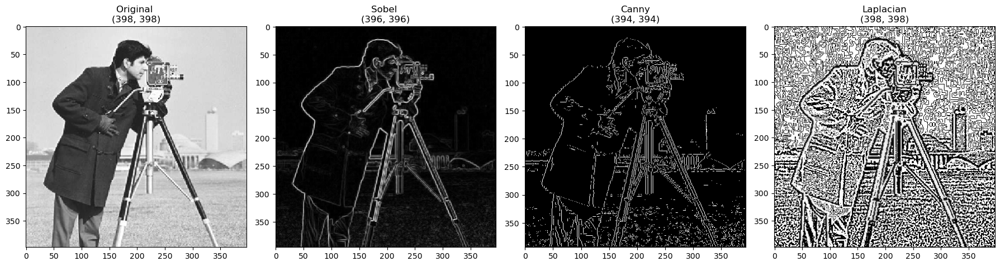

In [120]:
sobel = sobel_edge_detection(img)
canny = canny_edge_detector(img, 10, 70)
LoG = laplacian_of_gaussian(img, 1)

# Plot
fig, axes = plt.subplots(1, 4, figsize=(18, 6))

axes[0].imshow(img, cmap="gray")
axes[0].set_title("Original \n" + str(img.shape))
axes[1].imshow(sobel, cmap="gray")
axes[1].set_title("Sobel \n" + str(sobel.shape))
axes[2].imshow(canny, cmap="gray")
axes[2].set_title("Canny\n"  + str(canny.shape))
axes[3].imshow(LoG, cmap="binary")
axes[3].set_title("Laplacian\n"  + str(LoG.shape))

plt.tight_layout()
plt.show()

## 3.Watersheds

**Objective:**
Implement the watershed algorithm for image segmentation.

**Guideline:**
1. Load a Color Image
2. Preprocessing for Marker Computation. Grayscale it, and find `sure`regions for foreground and background areas.
3. Compute Markers: Label the regions (foreground, background, and unknown) to create markers.
4. Apply Watershed Algorithm. use `cv2.watershed` from OpenCV to perform the segmentation. (Optional: implement your own version of watershed by hand)
5. Visualize the Results and display the segmented image, highlighting the boundaries obtained from the watershed algorithm.

### Expected Results:
- Visual representation of image segmentation using the watershed algorithm. Compare the results qualitatively with the original image.


In [122]:
# From lab 2:
def dilation(image, structuring_element):
    # Padding:
    pad = structuring_element.shape[0]//2
    padded = np.full((image.shape[0] + structuring_element.shape[0], image.shape[1] + structuring_element.shape[1]), 0)
    padded[pad:image.shape[0] + pad, pad:image.shape[1] + pad] = image
    
    # Creation of output
    output = np.full((image.shape[0], image.shape[1]), 0)
    
    # Get patch for each pixel
    for i in range(image.shape[0]):
        for j in range (image.shape[1]):
            # Get patch using structuring element
            patch = padded[i:i+structuring_element.shape[0], j:j+structuring_element.shape[1]]
            output[i, j] = np.max(patch[structuring_element == 1])
    return output

def erosion(image, structuring_element):
    # Padding:
    pad = structuring_element.shape[0]//2
    padded = np.full((image.shape[0] + structuring_element.shape[0], image.shape[1] + structuring_element.shape[1]), 255)
    padded[pad:image.shape[0] + pad, pad:image.shape[1] + pad] = image
    
    # Creation of output
    output = np.full((image.shape[0], image.shape[1]), 255)
    
    # Get patch for each pixel
    for i in range(image.shape[0]):
        for j in range (image.shape[1]):
            # Get patch using structuring element
            patch = padded[i:i+structuring_element.shape[0], j:j+structuring_element.shape[1]]
            output[i, j] = np.min(patch[structuring_element == 1])
    return output

def opening(image, structuring_element):
    eroded = erosion(image, structuring_element)
    opened_img = dilation(eroded, structuring_element)
    return np.where(opened_img > 128, 255, 0).astype(np.uint8)

In [123]:
def load_color_image(file_path: str) -> np.ndarray:
    image = cv2.imread(file_path)
    # Check
    if image is None:
        raise FileNotFoundError(f"Image not found at {file_path}")
    # BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def preprocess_for_markers(image: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Obtain binary regions for foreground and background
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Noise removal
    k = np.ones((3, 3), np.uint8)
    opened = opening(binary, k)
    sure_bg = dilation(opened, k)

    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opened, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = sure_bg - sure_fg

    return binary, dist_transform, sure_fg, sure_bg, unknown

def compute_markers(foreground: np.ndarray, background: np.ndarray,  unknown: np.ndarray) -> np.ndarray:
    # Marker labeling
    markers = np.zeros_like(foreground, dtype=np.int32)
    ret, markers = cv2.connectedComponents(foreground) # Label connected components in the foreground
    # Each connected component is assigned a unique label. The result is an array of markers.
    markers = markers+1 # Avoid having 0 (since it is for background)
    markers[unknown==255] = 0 #assing 0 where we don't know

    return markers

def apply_watershed(image: np.ndarray, markers: np.ndarray, manual: bool = False) -> np.ndarray:
    if manual:
        # Do manual watershed (optional)
        pass
    else:
        markers_copy = markers.copy()  # Make a copy of the markers array
        cv2.watershed(image, markers_copy)
        segmented_image = np.copy(image)
        segmented_image[markers_copy == -1] = [255, 0, 0]  # Boundaries in color red
        
    return segmented_image

def visualize_segmentation(original_image: np.ndarray, binary: np.ndarray, dist_transform: np.ndarray, colored_markers: np.ndarray, segmented_image: np.ndarray):
    # Plot
    fig, axes = plt.subplots(1, 5, figsize = (20, 5))

    axes[0].imshow(original_image, cmap="gray")
    axes[0].set_title("Original \n" + str(original_image.shape))
    axes[1].imshow(binary, cmap="gray")
    axes[1].set_title("Binary \n" + str(binary.shape))
    axes[2].imshow(dist_transform, cmap="gray")
    axes[2].set_title("Distance transform\n"  + str(dist_transform.shape))
    axes[3].imshow(colored_markers, cmap="gray")
    axes[3].set_title("Markers\n"  + str(colored_markers.shape))
    axes[4].imshow(segmented_image, cmap="gray")
    axes[4].set_title("Segmented image\n"  + str(segmented_image.shape))

    plt.tight_layout()
    plt.show()

def watershed_segmentation(image):
    color_image = load_color_image(image)
    binary, dist_transform, sure_fg, sure_bg, unknown = preprocess_for_markers(color_image)
    markers = compute_markers(sure_fg, sure_bg, unknown)
    
    # Just to visualize in JET colormap
    # With this line of code, i have it with all shades of gray
    # colored_markers = cv2.applyColorMap((markers % 256).astype(np.uint8), cv2.COLORMAP_JET)
    colormap = plt.get_cmap('jet', 256)
    # Normalize markers to range [0, 1]
    norm = plt.Normalize(vmin=markers.min(), vmax=markers.max())
    # Apply color map and normalize
    colored_markers = colormap(norm(markers))
    # Convert to 8-bit RGB for visualization
    colored_markers = (colored_markers[:, :, :3] * 255).astype(np.uint8)
    # Set background (label 0) to black
    colored_markers[markers == 0] = [0, 0, 0]
    
    segmented_image = apply_watershed(color_image, markers)  
    visualize_segmentation(color_image, binary, dist_transform, colored_markers, segmented_image)

    return segmented_image

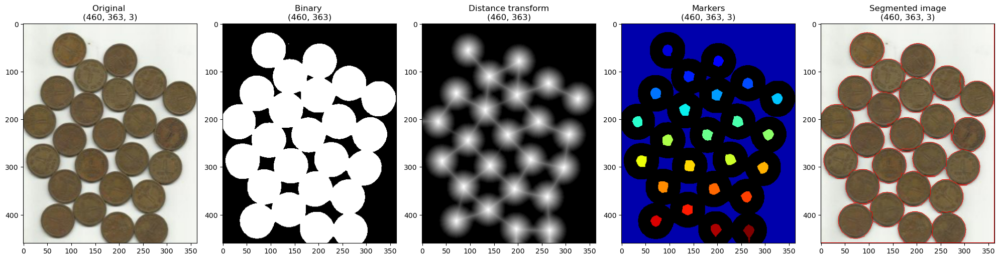

In [124]:
image_path = "C:/Users/Momo/OneDrive/Escriptori/Computer vision/Lab 3/watershed.png"
result = watershed_segmentation(image_path)

---
The result is a pretty good image segmentation. I am not sure why it gets a line to the lower and right margins

---

## 4.Region-Based Segmentation Exercise
**Objective:**  
Explore and implement one region-based segmentation technique. The options are Region Growing, Split-and-Merge, and Flood Fill. These techniques focus on creating image segments based on the similarity and proximity of pixels.

**Guideline:**
1. Choose one of the region-based segmentation methods:
   - **Split-and-Merge (using RAG):** Recursively divides an image into homogeneous regions, then merges adjacent regions with similar characteristics. Represent the image as a Region Adjacency Graph (RAG) using the scikit-image library.
   - **Flood Fill:** Begins from a seed point and expands the region by adding neighboring pixels that match the seed’s properties.

2. Implement the chosen method manually or using appropriate libraries (you can rely on `scikit-image` libraries)
3. Apply the algorithm to a sample image and analyze the results.
4. Perform an analisys of the hyperparameters of the method

**Expected Results:**  
- A segmented image using the selected region-based segmentation method.
- Comparative analysis of the segmented results against the original image to evaluate the effectiveness of the chosen method.


In [132]:
# "C:/Users/Momo/OneDrive/Escriptori/Computer vision/Lab 3/fill.png"

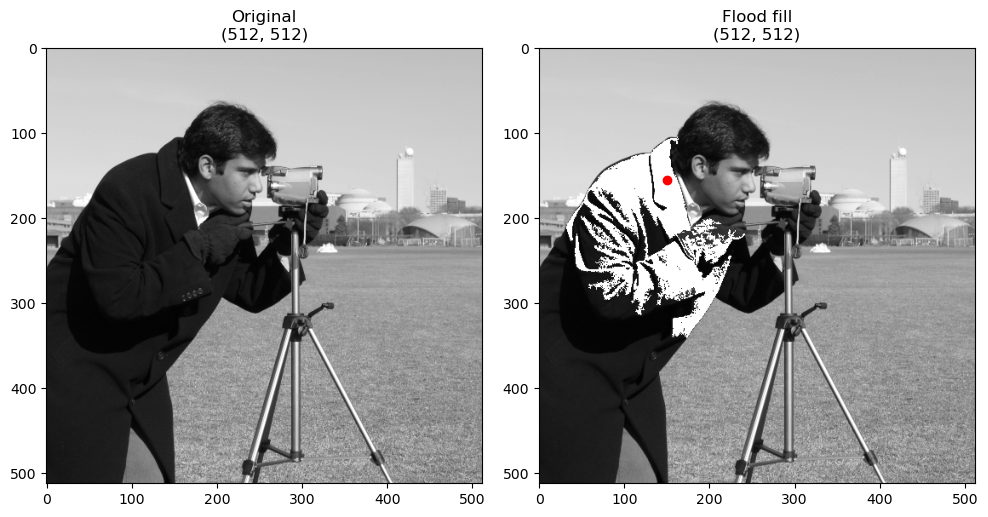

In [160]:
from skimage import data, io
from skimage.segmentation import flood_fill
import matplotlib.pyplot as plt

# Load the cameraman image
image = cv2.imread("C:/Users/Momo/OneDrive/Escriptori/Computer vision/Lab 3/fill.png", 0)

flood_filled = flood_fill(cameraman, (155, 150), 255, tolerance=10)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(cameraman, cmap="gray")
axes[0].set_title("Original\n" + str(cameraman.shape))
axes[1].imshow(flood_filled, cmap=plt.cm.gray)
axes[1].plot(150, 155, 'ro')  # seed point
axes[1].set_title("Flood fill\n" + str(cameraman.shape))

plt.tight_layout()
plt.show()

---
To perform an analysis of the hyperparameters, i will try to play with other values and see what changes

---

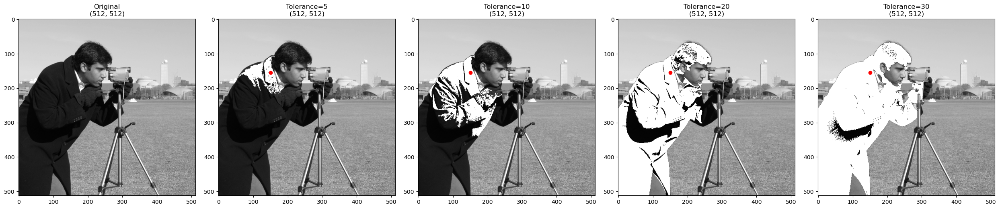

In [161]:
tolerance_values = [5, 10, 20, 30]

fig, axes = plt.subplots(1, 5, figsize=(25, 5))

axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original\n" + str(image.shape))

# Perform flood fill for different tolerance values and plot the results
for i, tolerance in enumerate(tolerance_values):
    flood_filled = flood_fill(image, (155, 150), 255, tolerance=tolerance)
    axes[i+1].imshow(flood_filled, cmap=plt.cm.gray)
    axes[i+1].plot(150, 155, 'ro')  # seed point
    axes[i+1].set_title(f"Tolerance={tolerance}\n" + str(image.shape))

plt.tight_layout()
plt.show()

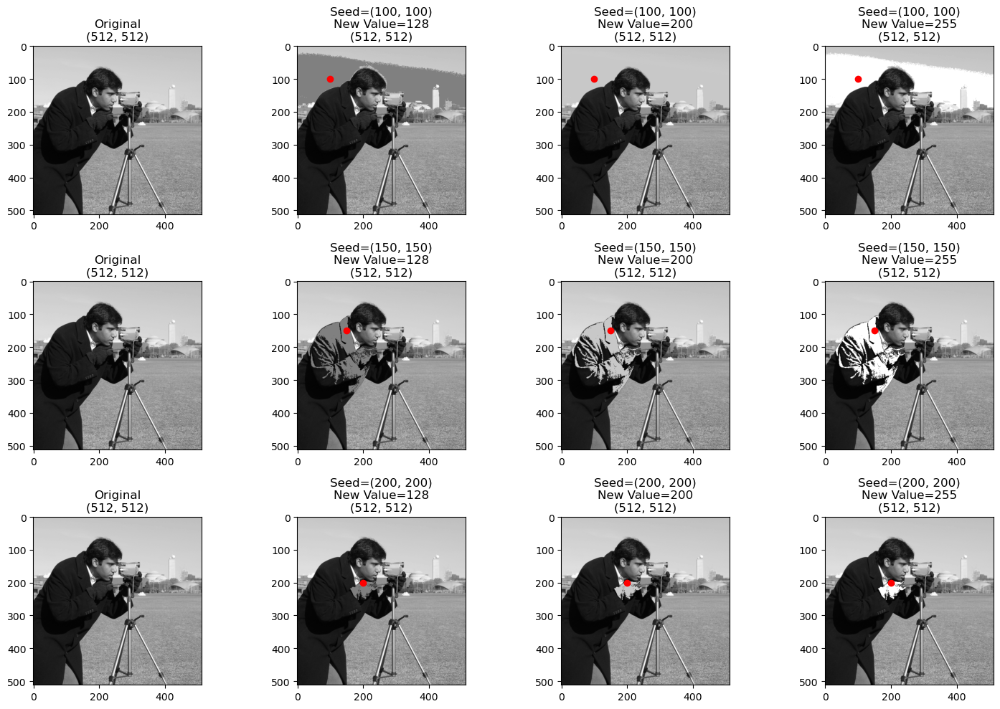

In [168]:
seeds = [(100, 100), (150, 150), (200, 200)]
values = [128, 200, 255]

fig, axes = plt.subplots(3, 4, figsize=(15, 10))

# Plot the original image
axes[0][0].imshow(image, cmap="gray")
axes[0][0].set_title("Original\n" + str(image.shape))
axes[1][0].imshow(image, cmap="gray")
axes[1][0].set_title("Original\n" + str(image.shape))
axes[2][0].imshow(image, cmap="gray")
axes[2][0].set_title("Original\n" + str(image.shape))

# Perform flood fill for different seed points and new values, and plot the results
for i, seed in enumerate(seeds):
    for j, value in enumerate(values):
        flood_filled = flood_fill(image, seed, value, tolerance=10)
        axes[i][j+1].imshow(flood_filled, cmap=plt.cm.gray)
        axes[i][j+1].plot(seed[1], seed[0], 'ro')  # seed point
        axes[i][j+1].set_title(f"Seed={seed}\nNew Value={value}\n" + str(image.shape))

plt.tight_layout()
plt.show()

---
After a lot of plotting, we can see that the tolerance value indicates the flexibility with which we assume some colors are similar.
* With a high tolerance, we allow more colors to be classified as similar so as a result we get a larger area
* With a low tolerance, less colors are considered similar so from the neighbors, less pixels are selected to be changed

The seed value (coordenate) indicates the points where the algorithm starts, so it could be seen as a refference of the area where we are changing values. 

Lastly, the new value is the value we put in the selected are. As seen in the previous plot (where we go from 128, 200 to 255), the region that changes value, gets this new one. So, the new value determines the value that the area gets. In the plot, in the case of 128, we see that it is a dark gray. Contrarily, when the new value is 255, the are is changed to white. 

---

## 4. Cluster-based Segmentation Exercise

**Objective:**  
Analysis between K-means clustering and Gaussian Mixture Models (GMM).
You can use the code or modify at your own.

**Guideline:**
1. Load a color image.
2. Perform an analisys of the hyperparameters of the method
3. Analyze the results and compare the effectiveness of the methods on image segmentation.
4. (Optional) Add extra functionalities to any algorithm

**Expected Results:**  
- Images segmented into distinct regions based on the clustering algorithm.
- In-depth analysis of the segmentation performance, discussing the suitability of the chosen method for the image characteristics.

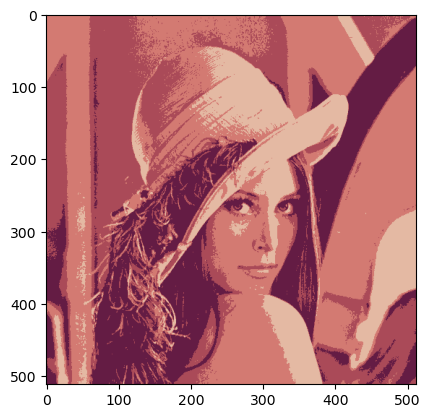

In [17]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from skimage.color import rgb2lab, rgb2hsv, hsv2rgb, lab2rgb
from skimage import io

def segment_image(image, color_space='RGB', auto_select_clusters=False, max_clusters=10, init='k-means++', n_init=10, max_iter=300, tol=1e-4, random_state=None):
    """
    Segments the given image using K-means clustering with options for automatic cluster selection and different color spaces.
    """

    # Convert image to the specified color space
    if color_space == 'HSV':
        converted_image = rgb2hsv(image)
    elif color_space == 'Lab':
        converted_image = rgb2lab(image)
    else:
        converted_image = image.copy()  # Copy to avoid modifying the original image

    # Preprocess the image
    image_reshaped = converted_image.reshape((-1, 3))

    # Automatic cluster selection
    if auto_select_clusters:
        best_score = -1
        best_k = 2
        for k in range(2, max_clusters + 1):
            kmeans = KMeans(n_clusters=k, init=init, n_init=n_init, max_iter=max_iter, tol=tol, random_state=random_state)
            labels = kmeans.fit_predict(image_reshaped)
            score = calinski_harabasz_score(image_reshaped, labels)
            if score > best_score:
                best_score = score
                best_k = k
        n_clusters = best_k
    else:
        n_clusters = max_clusters

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, init=init, n_init=n_init, max_iter=max_iter, tol=tol, random_state=random_state)
    kmeans.fit(image_reshaped)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]

    # Reshape the segmented image
    segmented_img = segmented_img.reshape(converted_image.shape)

    # Convert segmented image back to RGB if necessary
    if color_space == 'HSV':
        segmented_img = hsv2rgb(segmented_img)
    elif color_space == 'Lab':
        segmented_img = lab2rgb(segmented_img)
    elif color_space == 'RGB':
        segmented_img = segmented_img.astype(np.uint8)


    return segmented_img

import imutils
lenna = imutils.url_to_image('https://raw.githubusercontent.com/opencv/opencv/master/samples/data/lena.jpg')

plt.imshow(segment_image(lenna[:, :, ::-1],color_space='RGB', max_clusters=20, auto_select_clusters=True))
plt.show()

1: -365270.854877679
2: -1731632.4213824382
3: -1833276.354765519
4: -2027089.4194705177
5: -2063459.3141949647
6: -2122718.180312654
7: -2174723.2976253824
8: -2180776.912945975
9: -2193489.325547518
10: -2234200.247338004


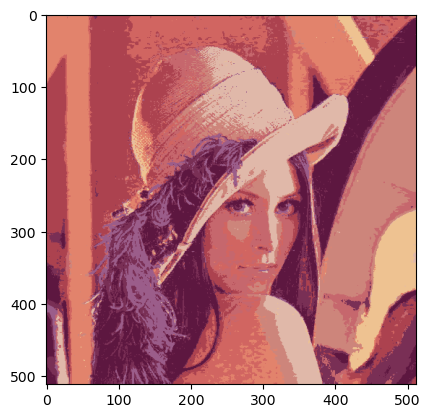

In [15]:
import numpy as np
from sklearn.mixture import GaussianMixture
from skimage import io, color


def segment_image2(image, color_space='hsv', max_components=10, covariance_type='tied'):
    """
    Segments an image using Gaussian Mixture Models.

    Parameters:
    - resize_factor: int, factor by which the image is resized to reduce computation.
    - color_space: str, color space to convert the image ('rgb', 'hsv', 'lab', etc.).
    - n_components: int, number of components for GMM.
    - covariance_type: str, type of covariance parameters to use.
    - normalization: bool, whether to normalize the image data.

    Returns:
    - segmented_image: np.ndarray, the segmented image.
    """

    # Resize for faster processing
    # Convert to desired color space
    if color_space == 'hsv':
        image_converted = color.rgb2hsv(image)
    elif color_space == 'lab':
        image_converted = color.rgb2lab(image)
    else:
        image_converted = image

    # Reshape the image to be a two-dimensional array
    image_array = image_converted.reshape(-1, 3)

    best_aic = np.inf
    best_n_components = 1

    for n in range(1, max_components + 1):
        gmm = GaussianMixture(n_components=n, covariance_type=covariance_type, random_state=0)
        gmm.fit(image_array)
        current_aic = gmm.aic(image_array)
        print(f"{n}: {current_aic}")
        if current_aic < best_aic:
            best_aic = current_aic
            best_n_components = n

    # Initialize and fit the GMM
    gmm = GaussianMixture(n_components=best_n_components, covariance_type=covariance_type, random_state=0)
    gmm.fit(image_array)

    # Predict the cluster assignment for each pixel
    segmentation = gmm.predict(image_array)

    # Replace each pixel with the mean color of its segment
    means = gmm.means_
    segmented_image = np.array([means[label] for label in segmentation])

    # Reshape back to the original image shape
    segmented_image = segmented_image.reshape(image.shape[0], image.shape[1], 3)

    # Convert back to RGB if necessary
    if color_space == 'hsv':
        segmented_image = color.hsv2rgb(segmented_image)
    elif color_space == 'lab':
        segmented_image = color.lab2rgb(segmented_image)
    
    return segmented_image

plt.imshow(segment_image2(lenna[:, :, ::-1], color_space='hsv', max_components=10, covariance_type='full'))
plt.show()

## 4.1. Analysis on the hyperparameters:
As indicated in the beggining of this notebook, the two models work similarly but still with some differences.
While both segment the images into clusters according to the pixel's intensisty or color, the process they follow is difference
- K-means Clustering: Partitions the image into clusters based on pixel color or intensity, with the number of clusters predefined.
- Gaussian Mixture Models (GMM): Uses a probabilistic model to represent normally distributed subpopulations within the overall population, providing a soft-segmentation of the image.

The main difference is approach they use. In other words, K-means uses hard segmentation while GMM uses soft segmentation. If we look into the algorithm, we see that k-means has a prefixed number of clusters. For each cluster it has a centroid (in this case it's the mean color of the cluster) and each pixel is assigned to one and only one cluster: whichever centroid is closer to the pixel's intensity or color. 
On the other hand, GMM uses probability working with Gaussian distributions. Each pixel is probabilistically assigned to the clusters. It doesn't say that one cluster is responsible for that pixel, it says the probability of the pixel of belonging to each cluster. This results in overlapping clusters, meaning that one pixel can belong to multiple distributions simultaneously. Again, this is done this way because each cluster has a different distribution (indicated by the covariance and other characteristics in a Gaussian distribution). So, while a pixel can be very probable of a cluster and its distribution, it doesn't mean it can't belong to a less probable cluster's distribution. 

I have changed the second function to "segment_image2" so that i can play with both functions at the same time

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


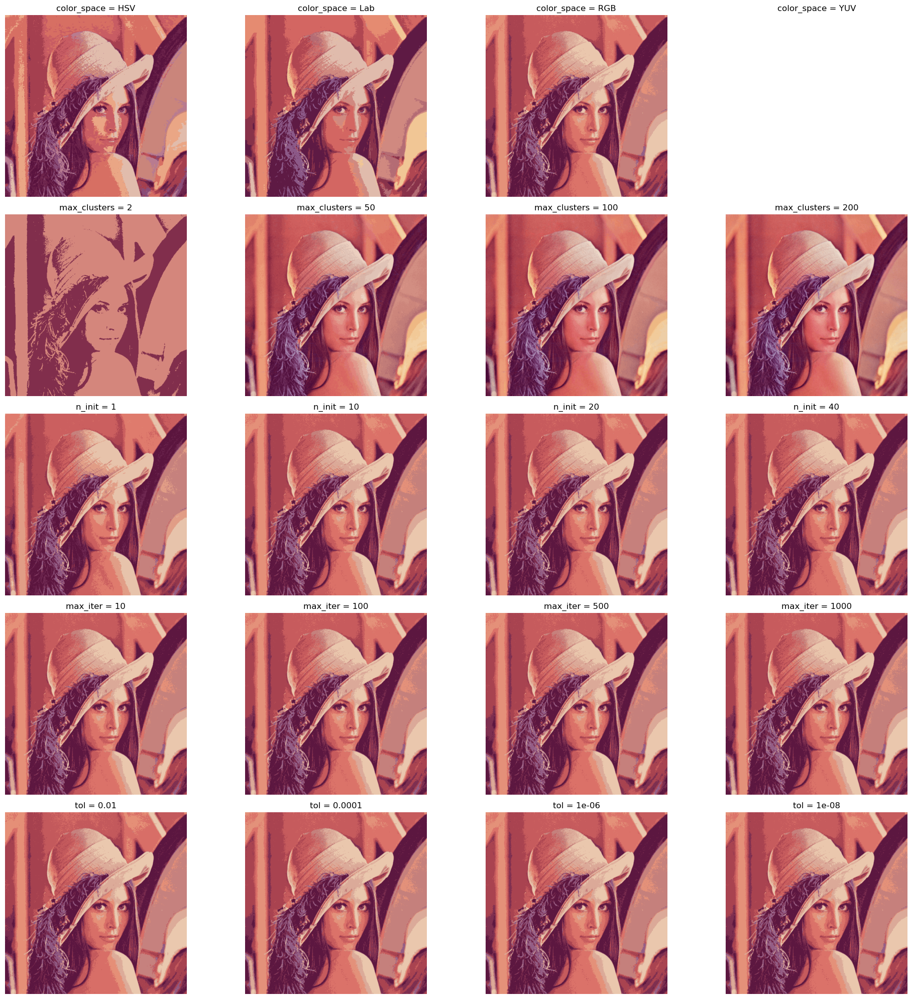

In [21]:
# Define the range of values for each parameter we will analyze
param_values = {
    'color_space': ['HSV', 'Lab', 'RGB', 'YUV'], 
    'max_clusters': [2, 50, 100, 200],
    'n_init': [1, 10, 20, 40],
    'max_iter': [10, 100, 500, 1000],
    'tol': [1e-2, 1e-4, 1e-6, 1e-8]}

# Create a figure for the plots
fig, axs = plt.subplots(len(param_values), 4, figsize=(20, 20))

for i, (param, values) in enumerate(param_values.items()):
    for j, value in enumerate(values):
        # Call the function with the new parameter value, while keeping the others fixed
        segmented_img = segment_image(lenna[:, :, ::-1], **{param: value})

        # Add the segmented image to the plot
        axs[i, j].imshow(segmented_img)
        axs[i, j].set_title(f'{param} = {value}')
        axs[i, j].axis('off')

# Display the plots
plt.tight_layout()
plt.show()

* Color is the color space in which the image is processed
* max_clusters specifies the maximum number of clusters. Increasing this value will result in a more detailed segmentation, but it may also increase the risk of over-segmentation (dividing the image into too many small segments)

The following are all km-eans parameters:
* n_init is the number of times the K-Means algorithm will be run with different centroid seeds. The best result is kept. Increasing this value can improve the quality of the segmentation, but it will also increase the computational cost.
* max_iter is the maximum number of iterations for each run of the K-Means algorithm (this is usefull in case it needs to do many iterations and we want to stop it before). If the algorithm converges before reaching this number of iterations, it will stop early. Increasing this value can allow the algorithm to converge to a better solution, but it will also increase the computational cost the same way as n_init
* Tolerance indicates the convergence level. The algorithm will stop if the change in the within-cluster sum of squares is less than this value. Decreasing this value will make the algorithm run longer and potentially achieve a better segmentation, but it will also increase the computational cost.

1: -365270.85487767775
1: -365270.85487767775
2: -1491859.1411571822
3: -1632934.183639419
4: -1801810.8891093032
5: -1820111.8975819615
1: -365270.85487767775
2: -1491859.1411571822
3: -1632934.183639419
4: -1801810.8891093032
5: -1820111.8975819615
6: -1875139.2202625885
7: -1901810.9641816826
8: -1958867.8016295999
9: -1970031.7779928602
10: -1970071.833849889
1: -365270.85487767775
2: -1491859.1411571822
3: -1632934.183639419
4: -1801810.8891093032
5: -1820111.8975819615
6: -1875139.2202625885
7: -1901810.9641816826
8: -1958867.8016295999
9: -1970031.7779928602
10: -1970071.833849889
11: -2009057.4991867775
12: -2016064.1936563682
13: -2017843.3643200633
14: -2022755.686093221
15: -2057383.8909799943
1: -365270.854877679
2: -1731632.4213824382
3: -1833276.354765519
4: -2027089.4194705177
5: -2063459.3141949647
6: -2122718.180312654
7: -2174723.2976253824
8: -2180776.912945975
9: -2193489.325547518
10: -2234200.247338004
1: -365270.85487767775
2: -1491859.1411571822
3: -1632934.1836

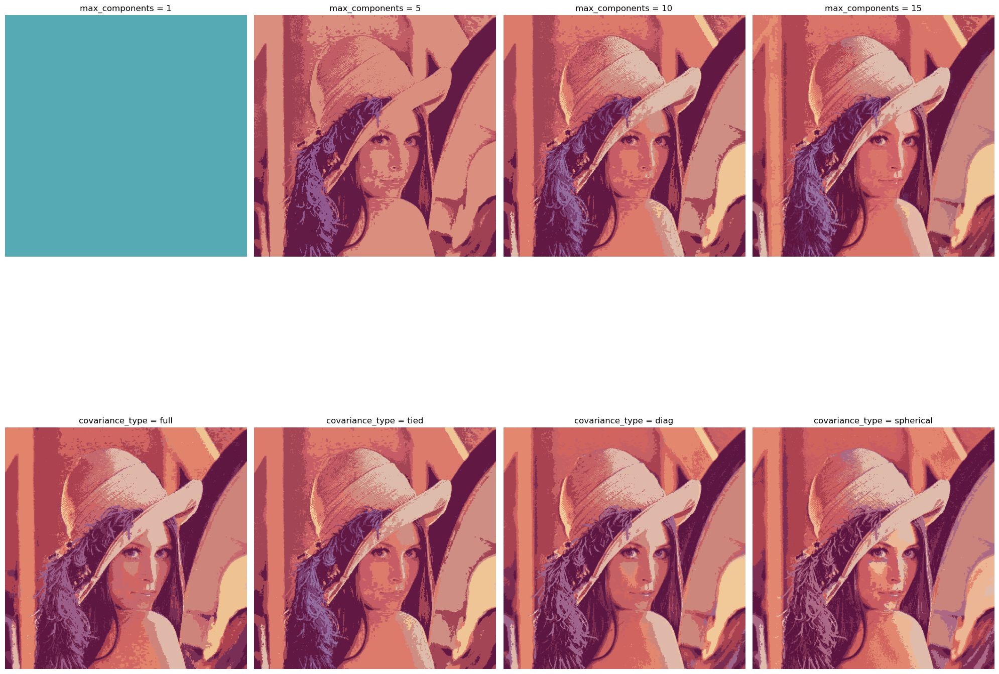

In [26]:
# Define the range of values for each parameter we will analyze
param_values = {
    'max_components': [1, 5, 10, 15],
    'covariance_type': ['full', 'tied', 'diag', 'spherical']}

# Create a figure for the plots
fig, axs = plt.subplots(len(param_values), 4, figsize=(20, 20))

for i, (param, values) in enumerate(param_values.items()):
    for j, value in enumerate(values):
        # Call the function with the new parameter value, while keeping the others fixed
        segmented_img = segment_image2(lenna[:, :, ::-1], **{param: value})

        # Add the segmented image to the plot
        axs[i, j].imshow(segmented_img)
        axs[i, j].set_title(f'{param} = {value}')
        axs[i, j].axis('off')

# Display the plots
plt.tight_layout()
plt.show()

* max_components determines the maximum number of Gaussian distributions (components) that the GMM will try to fit to the data. Each component corresponds to a segment in the image. Increasing max_components allows the model to consider solutions with more segments.
* covariance_type determines the type of covariance parameters to use. There are four types that can be used: 
- ‘full’ (each component has its own general covariance matrix)
- ‘tied’ (all components share the same general covariance matrix)
- ‘diag’ (each component has its own diagonal covariance matrix)
- ‘spherical’ (each component has its own single variance). 

Changing this parameter changes the shape, size, and orientation of the distribution of points (pixels) that belong to each segment. 

## 4.2. Analysis on the efficiency:

**In general**:

The best choice between the two would depend on the specific requirements of your task. For example, if computational efficiency is a concern, K-Means might be a better choice as it generally runs faster than GMM. On the other hand, if you’re dealing with complex data distributions, GMM might be more effective as it can model more complex shapes.

k-means assumes clusters are spherical and more or less the same size. It works well when clusters are relatively uniform. Instead, GMM is more flexible as it models clusters with Gaussian distributions, allowing for different shapes and sizes.

k-means is sensitive to outliers and noise. A single outlier can significantly affect cluster assignments while GMM is a little bit robust to outliers as it models data using probability distributions. So, outliers may have less impact on the overall model.

All this is very related to the soft/hard approach.
In terms of efficiency, K-means is more efficient and faster than GMM. Specially when we compare it with a large image, clusters...

So again, if the underlying data distribution is approximately spherical and the clusters are well-separated, K-means may be a good choice due to its simplicity and computational efficiency. If the clusters have different shapes, sizes, or orientations, GMM might be better.

**In the case of Lenna:**

Both the K-Means and Gaussian Mixture Models (GMM) methods can be used to segment the image. However, the effectiveness of each method can depend on what we are trying to find with the segmentation.

K-means is simple and computationally efficient, which makes it a good choice if we want to quickly segment the image into color-based regions. However, K-Means assumes that clusters are convex and isotropic, which may not always be the case in other images.

GMM is more flexible than K-Means because it can model elliptical as well as spherical clusters (depending on which argument is passed to the function). This can be beneficial if the color regions in the image are not round. GMM can result in smoother and more natural-looking segmentations given that it has a soft segmentation. However, GMM is more computationally intensive than K-Means.

In the case of the Lenna image, if we want a quick and rough segmentation, K-Means might be more effective. Instead, if we would like a more precise and smooth segmentation and computational cost is not a concern, GMM might be a better choice.